In [ ]:

from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Project folder in Drive
PROJECT_PATH = "/content/drive/MyDrive/brain_tumor_project"
os.makedirs(PROJECT_PATH, exist_ok=True)

print(f"Project files will be saved at: {PROJECT_PATH}")


Mounted at /content/drive
Project files will be saved at: /content/drive/MyDrive/brain_tumor_project


In [ ]:
from google.colab import files
files.upload() #adding kaggle json file

In [4]:
from google.colab import drive
drive.mount('/content/drive')
import os
save_dir = "/content/drive/MyDrive/brain_tumor_models"
os.makedirs(save_dir, exist_ok=True)
import os
save_dir = "/content/drive/MyDrive/brain_tumor_models"
os.makedirs(save_dir, exist_ok=True)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
#from tensorflow.keras.models import load_model
#model = load_model(f"{save_dir}/resnet50_brain_tumor.h5")



In [6]:
'''
resnet_model.save(f"{save_dir}/resnet50_brain_tumor.h5")
densenet_model.save(f"{save_dir}/densenet121_brain_tumor.h5")
efficient_model.save(f"{save_dir}/efficientnetb0_brain_tumor.h5")
'''

'\nresnet_model.save(f"{save_dir}/resnet50_brain_tumor.h5")\ndensenet_model.save(f"{save_dir}/densenet121_brain_tumor.h5")\nefficient_model.save(f"{save_dir}/efficientnetb0_brain_tumor.h5")\n'

In [7]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [8]:
!kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset


Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset
License(s): CC0-1.0
 84% 125M/149M [00:00<00:00, 1.30GB/s]
100% 149M/149M [00:00<00:00, 1.22GB/s]


In [9]:
!ls /content


brain-tumor-mri-dataset.zip  drive  kaggle.json  sample_data


In [10]:
!unzip -q /content/brain-tumor-mri-dataset.zip -d /content/brain_tumor


In [11]:
import os

for root, dirs, files in os.walk("/content/brain_tumor"):
    print(root, len(files))


/content/brain_tumor 0
/content/brain_tumor/Training 0
/content/brain_tumor/Training/notumor 1595
/content/brain_tumor/Training/meningioma 1339
/content/brain_tumor/Training/glioma 1321
/content/brain_tumor/Training/pituitary 1457
/content/brain_tumor/Testing 0
/content/brain_tumor/Testing/notumor 405
/content/brain_tumor/Testing/meningioma 306
/content/brain_tumor/Testing/glioma 300
/content/brain_tumor/Testing/pituitary 300


/content/brain_tumor/Training 0
/content/brain_tumor/Training/notumor 1595
/content/brain_tumor/Training/meningioma 1339
/content/brain_tumor/Training/glioma 1321
/content/brain_tumor/Training/pituitary 1457
Found 4571 images belonging to 4 classes.
Found 1141 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 53s 327ms/step - accuracy: 0.4752 - loss: 1.1171 - val_accuracy: 0.6924 - val_loss: 0.9089
Epoch 2/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 39s 276ms/step - accuracy: 0.7342 - loss: 0.6603 - val_accuracy: 0.7274 - val_loss: 0.7382
Epoch 3/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 39s 276ms/step - accuracy: 0.7933 - loss: 0.5296 - val_accuracy: 0.7450 - val_loss: 0.7004
Epoch 4/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 42s 292ms/step - accuracy: 0.8013 - loss: 0.5028 - val_accuracy: 0.7406 - val_loss: 0.7270
Epoch 5/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 39s 276ms/step - accuracy: 0.8209 - loss: 0.4528 - val_accuracy: 0.7642 - val_loss: 0.6189
Epoch 6/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 41s 275ms/step - accuracy: 0.8516 - loss: 0.4030 - val_accuracy: 0.7590 - val_loss: 0.6673
Epoch 7/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 39s 276ms/step - accuracy: 0.8646 - loss: 0.3546 - val_accuracy: 0.7686 - val_loss: 0.6869
Epoch 8/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 41s 286ms/step - accuracy: 0.8762 - loss: 0

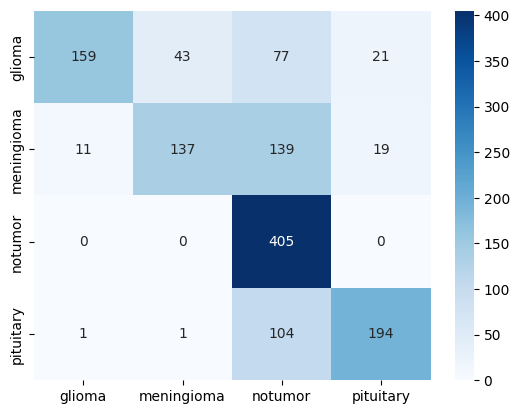

In [12]:
# Step 1: Import Libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from sklearn.metrics import classification_report, confusion_matrix

# Step 2: Paths
train_dir = "/content/brain_tumor/Training"
test_dir = "/content/brain_tumor/Testing"

# Step 3: Explore dataset
for root, dirs, files in os.walk(train_dir):
    print(root, len(files))

# Step 4: Data generators
IMG_SIZE = (150, 150)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2,
                                   rotation_range=20, zoom_range=0.2, horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(train_dir, target_size=IMG_SIZE,
                                              batch_size=BATCH_SIZE, class_mode="categorical", subset="training")

val_gen = train_datagen.flow_from_directory(train_dir, target_size=IMG_SIZE,
                                            batch_size=BATCH_SIZE, class_mode="categorical", subset="validation")

test_gen = test_datagen.flow_from_directory(test_dir, target_size=IMG_SIZE,
                                            batch_size=BATCH_SIZE, class_mode="categorical", shuffle=False)

# Step 5: Baseline CNN
model = Sequential([
    Conv2D(32, (3,3), activation="relu", input_shape=(150,150,3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation="relu"),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation="relu"),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.5),
    Dense(4, activation="softmax")
])

model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
history = model.fit(train_gen, validation_data=val_gen, epochs=10)

# Step 6: Evaluate
loss, acc = model.evaluate(test_gen)
print("Test Accuracy:", acc)

# Confusion Matrix
y_pred = model.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
cm = confusion_matrix(test_gen.classes, y_pred_classes)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=test_gen.class_indices, yticklabels=test_gen.class_indices)
plt.show()


In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = "/content/brain_tumor/Training"
test_dir = "/content/brain_tumor/Testing"

train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_gen = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)


Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


In [14]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

# Load ResNet50 base
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Freeze base layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classifier on top
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_gen.num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,638,852 (93.99 MB)

 Trainable params: 1,051,140 (4.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [15]:
history = model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=10,
    verbose=1
)


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 109s 533ms/step - accuracy: 0.3252 - loss: 1.5043 - val_accuracy: 0.4378 - val_loss: 1.1626
Epoch 2/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 463ms/step - accuracy: 0.4640 - loss: 1.1573 - val_accuracy: 0.5233 - val_loss: 1.1314
Epoch 3/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 84s 467ms/step - accuracy: 0.5250 - loss: 1.0865 - val_accuracy: 0.5423 - val_loss: 1.1058
Epoch 4/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 82s 458ms/step - accuracy: 0.5555 - loss: 1.0401 - val_accuracy: 0.5202 - val_loss: 1.1225
Epoch 5/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 142s 456ms/step - accuracy: 0.5721 - loss: 1.0309 - val_accuracy: 0.5454 - val_loss: 1.0912
Epoch 6/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 462ms/step - accuracy: 0.5858 - loss: 1.0128 - val_accuracy: 0.5973 - val_loss: 1.0552
Epoch 7/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 462ms/step - accuracy: 0.5965 - loss: 0.9973 - val_accuracy: 0.5934 - val_loss: 1.0240
Epoch 8/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 462ms/step - accuracy: 0.5971 - loss:

In [16]:
# Unfreeze some layers of ResNet50 (say, last 50 layers)
for layer in base_model.layers[-50:]:
    layer.trainable = True

# Recompile with a smaller learning rate
from tensorflow.keras.optimizers import Adam
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
history_finetune = model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=15,   # try 15 epochs for fine-tuning
    verbose=1
)


Epoch 1/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 128s 570ms/step - accuracy: 0.4634 - loss: 5.1898 - val_accuracy: 0.3211 - val_loss: 2.0640
Epoch 2/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 113s 477ms/step - accuracy: 0.6934 - loss: 0.7634 - val_accuracy: 0.6323 - val_loss: 0.9369
Epoch 3/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 465ms/step - accuracy: 0.7267 - loss: 0.6480 - val_accuracy: 0.6880 - val_loss: 0.8174
Epoch 4/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 86s 479ms/step - accuracy: 0.7413 - loss: 0.6224 - val_accuracy: 0.7323 - val_loss: 0.6553
Epoch 5/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 86s 476ms/step - accuracy: 0.7529 - loss: 0.6179 - val_accuracy: 0.7681 - val_loss: 0.5720
Epoch 6/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 86s 478ms/step - accuracy: 0.7654 - loss: 0.5708 - val_accuracy: 0.7330 - val_loss: 0.6226
Epoch 7/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 85s 475ms/step - accuracy: 0.7663 - loss: 0.5782 - val_accuracy: 0.7620 - val_loss: 0.5818
Epoch 8/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 84s 466ms/step - accuracy: 0.7812 - loss:

In [17]:
 #Unfreeze some layers of ResNet50 (say, last 50 layers)
for layer in base_model.layers[-100:]:
    layer.trainable = True

# Recompile with a smaller learning rate
from tensorflow.keras.optimizers import Adam
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
history_finetune = model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=15,   # try 15 epochs for fine-tuning
    verbose=1
)

Epoch 1/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 147s 622ms/step - accuracy: 0.4711 - loss: 6.3883 - val_accuracy: 0.3089 - val_loss: 12.2236
Epoch 2/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 95s 529ms/step - accuracy: 0.7052 - loss: 0.6970 - val_accuracy: 0.4424 - val_loss: 2.2644
Epoch 3/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 91s 507ms/step - accuracy: 0.7469 - loss: 0.6164 - val_accuracy: 0.6766 - val_loss: 0.9344
Epoch 4/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 89s 494ms/step - accuracy: 0.7637 - loss: 0.5877 - val_accuracy: 0.7681 - val_loss: 0.5545
Epoch 5/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 88s 492ms/step - accuracy: 0.7942 - loss: 0.5158 - val_accuracy: 0.7712 - val_loss: 0.5608
Epoch 6/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 142s 495ms/step - accuracy: 0.8110 - loss: 0.4749 - val_accuracy: 0.7948 - val_loss: 0.5368
Epoch 7/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 90s 500ms/step - accuracy: 0.8166 - loss: 0.4687 - val_accuracy: 0.8009 - val_loss: 0.5077
Epoch 8/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 89s 499ms/step - accuracy: 0.8377 - loss

In [18]:
model.save("resnet50_brain_tumor.h5")


In [19]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Predict on test set
y_pred = model.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

print(classification_report(y_true, y_pred_classes, target_names=test_gen.class_indices.keys()))

cm = confusion_matrix(y_true, y_pred_classes)
print(cm)


41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 187ms/step
              precision    recall  f1-score   support

      glioma       0.95      0.78      0.85       300
  meningioma       0.83      0.83      0.83       306
     notumor       0.94      1.00      0.97       405
   pituitary       0.91      0.99      0.94       300

    accuracy                           0.91      1311
   macro avg       0.91      0.90      0.90      1311
weighted avg       0.91      0.91      0.90      1311

[[233  50   7  10]
 [ 12 255  19  20]
 [  0   0 404   1]
 [  1   2   1 296]]


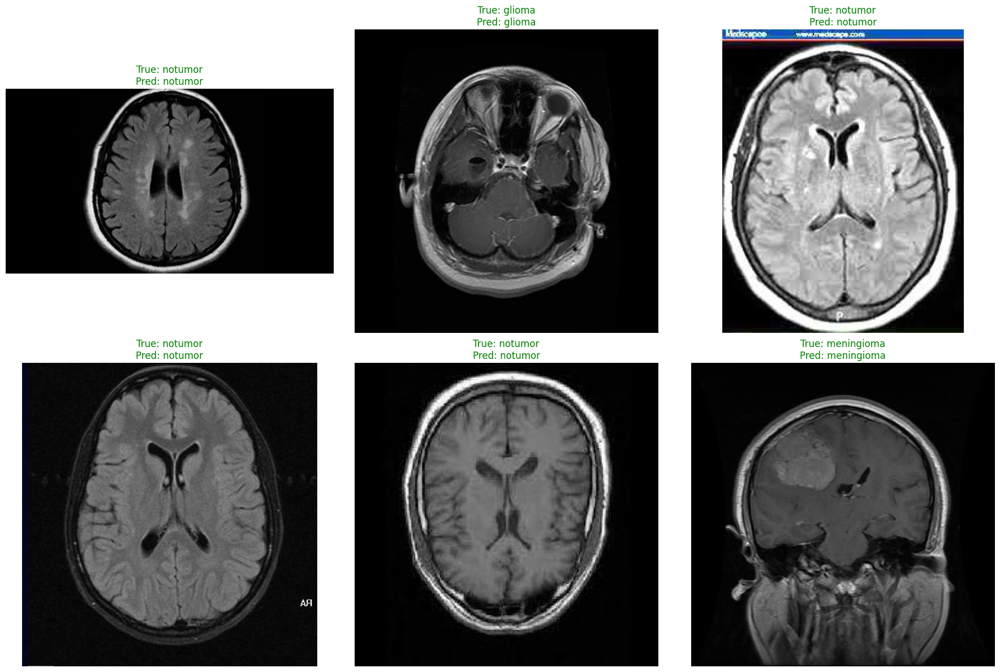

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import random
import tensorflow as tf

# Get class labels
class_labels = list(test_gen.class_indices.keys())

# True labels (from generator)
y_true = test_gen.classes

plt.figure(figsize=(18, 12))

for i in range(6):  # show 6 predictions
    idx = random.randint(0, len(test_gen.filenames)-1)
    img_path = test_gen.filepaths[idx]

    # Load image
    img = plt.imread(img_path)

    # Ensure 3 channels
    if img.ndim == 2:  # grayscale → RGB
        img = np.stack([img]*3, axis=-1)

    # Resize properly
    img_resized = tf.image.resize(img, (224, 224)).numpy()
    img_processed = np.expand_dims(img_resized, axis=0) / 255.0  # normalize like train_gen

    # Predict
    pred = model.predict(img_processed, verbose=0)
    pred_class = class_labels[np.argmax(pred)]
    true_class = class_labels[y_true[idx]]

    # Plot
    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(f"True: {true_class}\nPred: {pred_class}",
              color=("green" if true_class==pred_class else "red"))
    plt.axis("off")

plt.tight_layout()
plt.show()


In [22]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

# Load DenseNet121 base
base_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Freeze base layers first
for layer in base_densenet.layers:
    layer.trainable = False

# Add custom head
x = base_densenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_gen.num_classes, activation='softmax')(x)

densenet_model = Model(inputs=base_densenet.input, outputs=predictions)

# Compile
densenet_model.compile(optimizer=Adam(learning_rate=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

densenet_model.summary()


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,564,356 (28.86 MB)

 Trainable params: 526,852 (2.01 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [25]:
model.save(f"{save_dir}/resnet50_brain_tumor.h5")

In [26]:
history_dense = densenet_model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=10,
    verbose=1
)


Epoch 1/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 149s 669ms/step - accuracy: 0.4925 - loss: 1.2547 - val_accuracy: 0.7765 - val_loss: 0.5798
Epoch 2/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 81s 450ms/step - accuracy: 0.8002 - loss: 0.5344 - val_accuracy: 0.8398 - val_loss: 0.4859
Epoch 3/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 84s 470ms/step - accuracy: 0.8417 - loss: 0.4426 - val_accuracy: 0.8528 - val_loss: 0.4344
Epoch 4/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 140s 462ms/step - accuracy: 0.8609 - loss: 0.3963 - val_accuracy: 0.8406 - val_loss: 0.4366
Epoch 5/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 141s 459ms/step - accuracy: 0.8666 - loss: 0.3593 - val_accuracy: 0.8482 - val_loss: 0.4130
Epoch 6/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 81s 451ms/step - accuracy: 0.8799 - loss: 0.3361 - val_accuracy: 0.8558 - val_loss: 0.3815
Epoch 7/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 84s 469ms/step - accuracy: 0.8905 - loss: 0.3144 - val_accuracy: 0.8459 - val_loss: 0.3843
Epoch 8/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 141s 461ms/step - accuracy: 0.8918 - los

In [27]:
# Unfreeze last 100 layers
for layer in base_densenet.layers[-100:]:
    layer.trainable = True

# Recompile with lower LR
densenet_model.compile(optimizer=Adam(learning_rate=1e-5),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Fine-tune
history_dense_ft = densenet_model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=15,
    verbose=1
)


Epoch 1/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 201s 840ms/step - accuracy: 0.6499 - loss: 1.0453 - val_accuracy: 0.8863 - val_loss: 0.3153
Epoch 2/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 81s 453ms/step - accuracy: 0.8792 - loss: 0.3388 - val_accuracy: 0.9008 - val_loss: 0.2823
Epoch 3/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 462ms/step - accuracy: 0.8954 - loss: 0.2789 - val_accuracy: 0.9039 - val_loss: 0.2634
Epoch 4/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 82s 460ms/step - accuracy: 0.9108 - loss: 0.2531 - val_accuracy: 0.9077 - val_loss: 0.2494
Epoch 5/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 465ms/step - accuracy: 0.9155 - loss: 0.2272 - val_accuracy: 0.9123 - val_loss: 0.2297
Epoch 6/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 82s 461ms/step - accuracy: 0.9242 - loss: 0.2200 - val_accuracy: 0.9161 - val_loss: 0.2087
Epoch 7/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 81s 451ms/step - accuracy: 0.9191 - loss: 0.2078 - val_accuracy: 0.9222 - val_loss: 0.2010
Epoch 8/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 82s 459ms/step - accuracy: 0.9331 - loss: 

In [28]:
densenet_model.save("densenet121_brain_tumor.h5")


In [29]:
densenet_model.save(f"{save_dir}/densenet121_brain_tumor.h5")

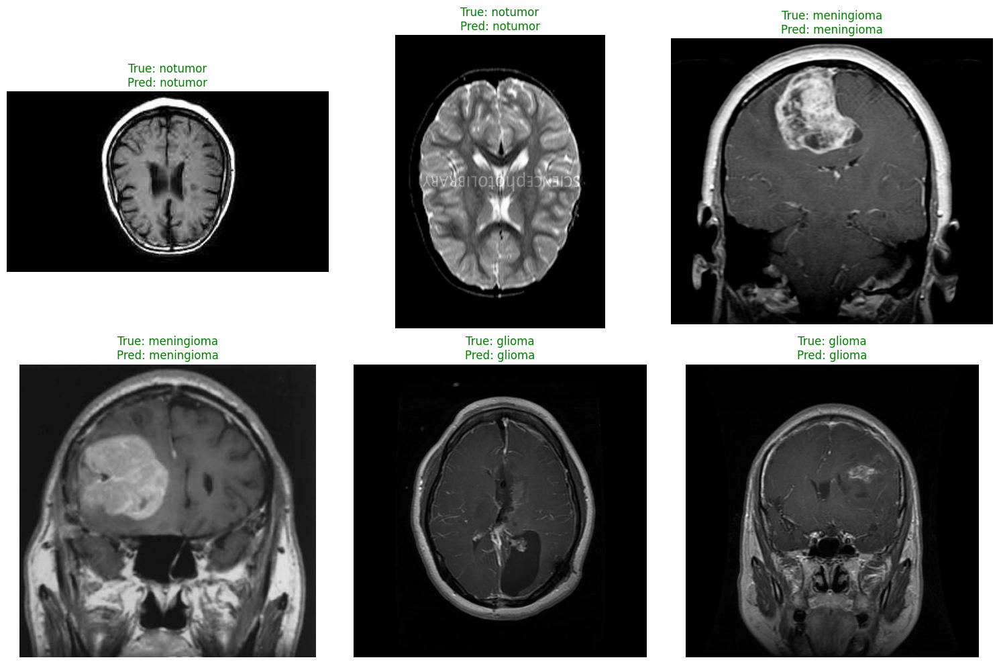

In [30]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
from tensorflow.keras.preprocessing import image

# Get class labels
class_indices = test_gen.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Pick random test images
test_img_paths = []
for cls in os.listdir("/content/brain_tumor/Testing"):
    cls_path = os.path.join("/content/brain_tumor/Testing", cls)
    if os.path.isdir(cls_path):
        sample_imgs = random.sample(os.listdir(cls_path), 2)  # 2 per class
        test_img_paths.extend([os.path.join(cls_path, img) for img in sample_imgs])

plt.figure(figsize=(15, 10))

for i, img_path in enumerate(test_img_paths[:6]):  # show 6 predictions
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    # Predict
    pred = densenet_model.predict(img_array, verbose=0)
    pred_class = idx_to_class[np.argmax(pred)]
    true_class = os.path.basename(os.path.dirname(img_path))

    # Plot
    plt.subplot(2, 3, i+1)
    plt.imshow(plt.imread(img_path))
    plt.title(f"True: {true_class}\nPred: {pred_class}",
              color=("green" if true_class == pred_class else "red"))
    plt.axis("off")

plt.tight_layout()
plt.show()


In [31]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Load EfficientNetB0 base
efficient_base = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Freeze base layers
for layer in efficient_base.layers:
    layer.trainable = False

# Add custom head
x = efficient_base.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_gen.num_classes, activation='softmax')(x)

efficient_model = Model(inputs=efficient_base.input, outputs=predictions)

# Compile
efficient_model.compile(optimizer=Adam(learning_rate=1e-4),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)

# Train
history_efficient = efficient_model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=15,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

# Save model
efficient_model.save("efficientnetb0_brain_tumor.h5")


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 140s 633ms/step - accuracy: 0.2588 - loss: 1.4089 - val_accuracy: 0.2288 - val_loss: 1.3938 - learning_rate: 1.0000e-04
Epoch 2/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 79s 443ms/step - accuracy: 0.2544 - loss: 1.3949 - val_accuracy: 0.3089 - val_loss: 1.3823 - learning_rate: 1.0000e-04
Epoch 3/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 75s 421ms/step - accuracy: 0.2686 - loss: 1.3877 - val_accuracy: 0.3089 - val_loss: 1.3754 - learning_rate: 1.0000e-04
Epoch 4/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 78s 436ms/step - accuracy: 0.2794 - loss: 1.3822 - val_accuracy: 0.4035 - val_loss: 1.3811 - learning_rate: 1.0000e-04
Epoch 5/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 77s 428ms/step - accuracy: 0.2720 - loss: 1.3874 - val_accuracy: 0.3089 - val_loss: 1.3780 - learning_rate: 1.0000e-04
Epoch 6/15
179/179 ━━━━━━━━━━━━━━━━━━━━ 77s 432ms/step - accuracy: 0.2818 - loss: 1.3837 - val_accuracy: 0.3089 - val_loss: 1.3753 - learning_rate: 1.000

In [33]:
import os
import numpy as np
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, LambdaCallback
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')
drive_path = '/content/drive/MyDrive/brain_tumor_models/'
os.makedirs(drive_path, exist_ok=True)

# --- EfficientNetB3 base ---
efficient_base = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(224,224,3))
for layer in efficient_base.layers:
    layer.trainable = False

# --- Custom head ---
x = efficient_base.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(train_gen.num_classes, activation='softmax')(x)
model = Model(inputs=efficient_base.input, outputs=predictions)

# Compile
model.compile(optimizer=Adam(1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Save training history callback
history_path = os.path.join(drive_path, 'efficientnetb3_history.npy')
history_data = {'loss':[], 'val_loss':[], 'accuracy':[], 'val_accuracy':[]}

def save_history(epoch, logs):
    for k in history_data.keys():
        history_data[k].append(logs.get(k))
    np.save(history_path, history_data)

history_callback = LambdaCallback(on_epoch_end=save_history)

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)
checkpoint = ModelCheckpoint(os.path.join(drive_path, 'efficientnetb3_best.h5'), monitor='val_loss', save_best_only=True, verbose=1)

# Train frozen model
model.fit(train_gen, validation_data=test_gen, epochs=10, callbacks=[early_stop, reduce_lr, checkpoint, history_callback])

# Fine-tune last 50 layers
for layer in efficient_base.layers[-50:]:
    layer.trainable = True

model.compile(optimizer=Adam(1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(train_gen, validation_data=test_gen, epochs=10, callbacks=[early_stop, reduce_lr, checkpoint, history_callback])

# Save final model
model.save(os.path.join(drive_path, 'efficientnetb3_final.h5'))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 1/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 579ms/step - accuracy: 0.3353 - loss: 1.3164
Epoch 1: val_loss improved from inf to 1.23178, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 178s 748ms/step - accuracy: 0.3355 - loss: 1.3162 - val_accuracy: 0.4683 - val_loss: 1.2318 - learning_rate: 1.0000e-04
Epoch 2/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.4022 - loss: 1.2127
Epoch 2: val_loss improved from 1.23178 to 1.21949, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 84s 471ms/step - accuracy: 0.4022 - loss: 1.2127 - val_accuracy: 0.4256 - val_loss: 1.2195 - learning_rate: 1.0000e-04
Epoch 3/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step - accuracy: 0.4526 - loss: 1.1855
Epoch 3: val_loss improved from 1.21949 to 1.20168, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 462ms/step - accuracy: 0.4526 - loss: 1.1855 - val_accuracy: 0.4310 - val_loss: 1.2017 - learning_rate: 1.0000e-04
Epoch 4/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step - accuracy: 0.4366 - loss: 1.1803
Epoch 4: val_loss did not improve from 1.20168
179/179 ━━━━━━━━━━━━━━━━━━━━ 83s 462ms/step - accuracy: 0.4367 - loss: 1.1803 - val_accuracy: 0.4226 - val_loss: 1.2028 - learning_rate: 1.0000e-04
Epoch 5/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step - accuracy: 0.4283 - loss: 1.1777
Epoch 5: val_loss improved from 1.20168 to 1.17978, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 82s 460ms/step - accuracy: 0.4283 - loss: 1.1777 - val_accuracy: 0.4958 - val_loss: 1.1798 - learning_rate: 1.0000e-04
Epoch 6/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step - accuracy: 0.4680 - loss: 1.1646
Epoch 6: val_loss improved from 1.17978 to 1.17161, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 85s 475ms/step - accuracy: 0.4680 - loss: 1.1646 - val_accuracy: 0.4973 - val_loss: 1.1716 - learning_rate: 1.0000e-04
Epoch 7/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step - accuracy: 0.4516 - loss: 1.1683
Epoch 7: val_loss did not improve from 1.17161
179/179 ━━━━━━━━━━━━━━━━━━━━ 139s 457ms/step - accuracy: 0.4517 - loss: 1.1682 - val_accuracy: 0.4821 - val_loss: 1.1742 - learning_rate: 1.0000e-04
Epoch 8/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step - accuracy: 0.4811 - loss: 1.1412
Epoch 8: val_loss did not improve from 1.17161
179/179 ━━━━━━━━━━━━━━━━━━━━ 80s 448ms/step - accuracy: 0.4810 - loss: 1.1412 - val_accuracy: 0.4935 - val_loss: 1.1919 - learning_rate: 1.0000e-04
Epoch 9/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step - accuracy: 0.4652 - loss: 1.1570
Epoch 9: val_loss improved from 1.17161 to 1.17087, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 85s 478ms/step - accuracy: 0.4652 - loss: 1.1570 - val_accuracy: 0.4897 - val_loss: 1.1709 - learning_rate: 1.0000e-04
Epoch 10/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step - accuracy: 0.4832 - loss: 1.1311
Epoch 10: val_loss did not improve from 1.17087
179/179 ━━━━━━━━━━━━━━━━━━━━ 81s 453ms/step - accuracy: 0.4832 - loss: 1.1311 - val_accuracy: 0.4950 - val_loss: 1.1752 - learning_rate: 1.0000e-04
Epoch 1/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 569ms/step - accuracy: 0.3850 - loss: 1.3408
Epoch 1: val_loss did not improve from 1.17087
179/179 ━━━━━━━━━━━━━━━━━━━━ 171s 684ms/step - accuracy: 0.3852 - loss: 1.3404 - val_accuracy: 0.3806 - val_loss: 1.3183 - learning_rate: 1.0000e-05
Epoch 2/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - accuracy: 0.4525 - loss: 1.1662
Epoch 2: val_loss did not improve from 1.17087
179/179 ━━━━━━━━━━━━━━━━━━━━ 84s 471ms/step - accuracy: 0.4525 - loss: 1.1661 - val_accuracy: 0.4264 - val_loss: 1.2096 - learning_rate: 1.0000e-05


179/179 ━━━━━━━━━━━━━━━━━━━━ 89s 498ms/step - accuracy: 0.4766 - loss: 1.1307 - val_accuracy: 0.4760 - val_loss: 1.1592 - learning_rate: 1.0000e-05
Epoch 4/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step - accuracy: 0.4971 - loss: 1.1162
Epoch 4: val_loss improved from 1.15923 to 1.13287, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 86s 480ms/step - accuracy: 0.4971 - loss: 1.1162 - val_accuracy: 0.5034 - val_loss: 1.1329 - learning_rate: 1.0000e-05
Epoch 5/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step - accuracy: 0.5126 - loss: 1.0909
Epoch 5: val_loss did not improve from 1.13287
179/179 ━━━━━━━━━━━━━━━━━━━━ 82s 456ms/step - accuracy: 0.5126 - loss: 1.0908 - val_accuracy: 0.4973 - val_loss: 1.1445 - learning_rate: 1.0000e-05
Epoch 6/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step - accuracy: 0.5215 - loss: 1.0776
Epoch 6: val_loss did not improve from 1.13287
179/179 ━━━━━━━━━━━━━━━━━━━━ 91s 507ms/step - accuracy: 0.5216 - loss: 1.0776 - val_accuracy: 0.4859 - val_loss: 1.1457 - learning_rate: 1.0000e-05
Epoch 7/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - accuracy: 0.5376 - loss: 1.0485
Epoch 7: val_loss improved from 1.13287 to 1.11680, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 88s 493ms/step - accuracy: 0.5375 - loss: 1.0485 - val_accuracy: 0.5118 - val_loss: 1.1168 - learning_rate: 1.0000e-05
Epoch 8/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.5446 - loss: 1.0358
Epoch 8: val_loss improved from 1.11680 to 1.08903, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 85s 476ms/step - accuracy: 0.5445 - loss: 1.0359 - val_accuracy: 0.5240 - val_loss: 1.0890 - learning_rate: 1.0000e-05
Epoch 9/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step - accuracy: 0.5384 - loss: 1.0418
Epoch 9: val_loss improved from 1.08903 to 1.06559, saving model to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_best.h5


179/179 ━━━━━━━━━━━━━━━━━━━━ 144s 485ms/step - accuracy: 0.5384 - loss: 1.0418 - val_accuracy: 0.5500 - val_loss: 1.0656 - learning_rate: 1.0000e-05
Epoch 10/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.5566 - loss: 1.0251
Epoch 10: val_loss did not improve from 1.06559
179/179 ━━━━━━━━━━━━━━━━━━━━ 87s 482ms/step - accuracy: 0.5566 - loss: 1.0251 - val_accuracy: 0.5309 - val_loss: 1.0903 - learning_rate: 1.0000e-05


In [34]:
from google.colab import drive
import os
import tensorflow as tf

# 1️⃣ Mount Google Drive
drive.mount('/content/drive')
drive_path = '/content/drive/MyDrive/brain_tumor_models/'
os.makedirs(drive_path, exist_ok=True)

# 2️⃣ Save current model checkpoint (if training is ongoing)
# Replace 'model' with your EfficientNetB3 model variable
checkpoint_path = os.path.join(drive_path, 'efficientnetb3_checkpoint.h5')
model.save(checkpoint_path)
print(f"EfficientNetB3 model saved to Drive at: {checkpoint_path}")

# 3️⃣ Optional: Save as native Keras format (recommended for modern usage)
keras_path = os.path.join(drive_path, 'efficientnetb3_checkpoint.keras')
model.save(keras_path)
print(f"EfficientNetB3 model saved in .keras format at: {keras_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
EfficientNetB3 model saved to Drive at: /content/drive/MyDrive/brain_tumor_models/efficientnetb3_checkpoint.h5
EfficientNetB3 model saved in .keras format at: /content/drive/MyDrive/brain_tumor_models/efficientnetb3_checkpoint.keras


41/41 ━━━━━━━━━━━━━━━━━━━━ 25s 325ms/step


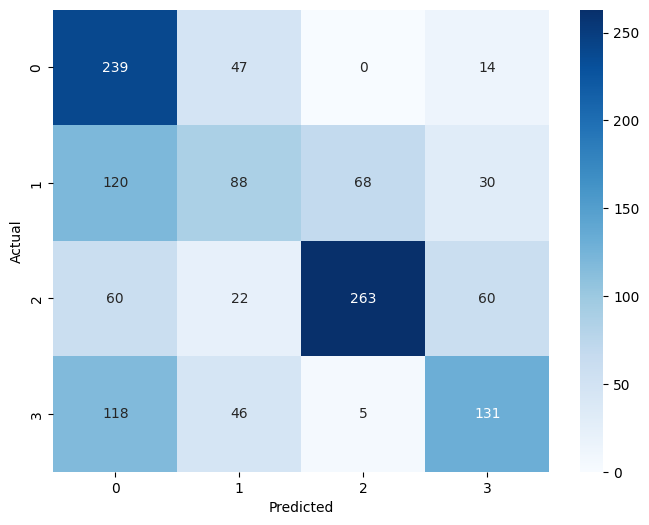

              precision    recall  f1-score   support

      glioma       0.45      0.80      0.57       300
  meningioma       0.43      0.29      0.35       306
     notumor       0.78      0.65      0.71       405
   pituitary       0.56      0.44      0.49       300

    accuracy                           0.55      1311
   macro avg       0.55      0.54      0.53      1311
weighted avg       0.57      0.55      0.54      1311



In [35]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Predict on test set
test_gen.reset()
y_pred = model.predict(test_gen, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Classification report
print(classification_report(y_true, y_pred_classes, target_names=list(test_gen.class_indices.keys())))


In [36]:
import pandas as pd
import numpy as np

# Get ground truth and predictions
y_true = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

y_pred_probs = model.predict(test_gen)
y_pred = np.argmax(y_pred_probs, axis=1)

# Build dataframe
results_df = pd.DataFrame({
    'Actual': [class_labels[i] for i in y_true],
    'Predicted': [class_labels[i] for i in y_pred]
})

# Show first few rows
print(results_df.head(20))

# Save to Drive for later use
results_path = drive_path + "efficientnetb3_actual_vs_predicted.csv"
results_df.to_csv(results_path, index=False)
print(f"Saved Actual vs Predicted to {results_path}")


41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step
    Actual Predicted
0   glioma    glioma
1   glioma    glioma
2   glioma    glioma
3   glioma    glioma
4   glioma    glioma
5   glioma    glioma
6   glioma    glioma
7   glioma    glioma
8   glioma    glioma
9   glioma    glioma
10  glioma    glioma
11  glioma    glioma
12  glioma    glioma
13  glioma    glioma
14  glioma    glioma
15  glioma    glioma
16  glioma    glioma
17  glioma    glioma
18  glioma    glioma
19  glioma    glioma
Saved Actual vs Predicted to /content/drive/MyDrive/brain_tumor_models/efficientnetb3_actual_vs_predicted.csv


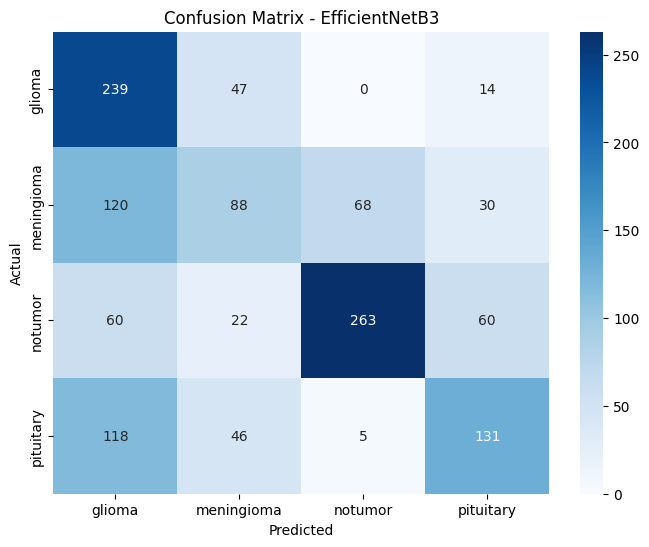

              precision    recall  f1-score   support

      glioma       0.45      0.80      0.57       300
  meningioma       0.43      0.29      0.35       306
     notumor       0.78      0.65      0.71       405
   pituitary       0.56      0.44      0.49       300

    accuracy                           0.55      1311
   macro avg       0.55      0.54      0.53      1311
weighted avg       0.57      0.55      0.54      1311



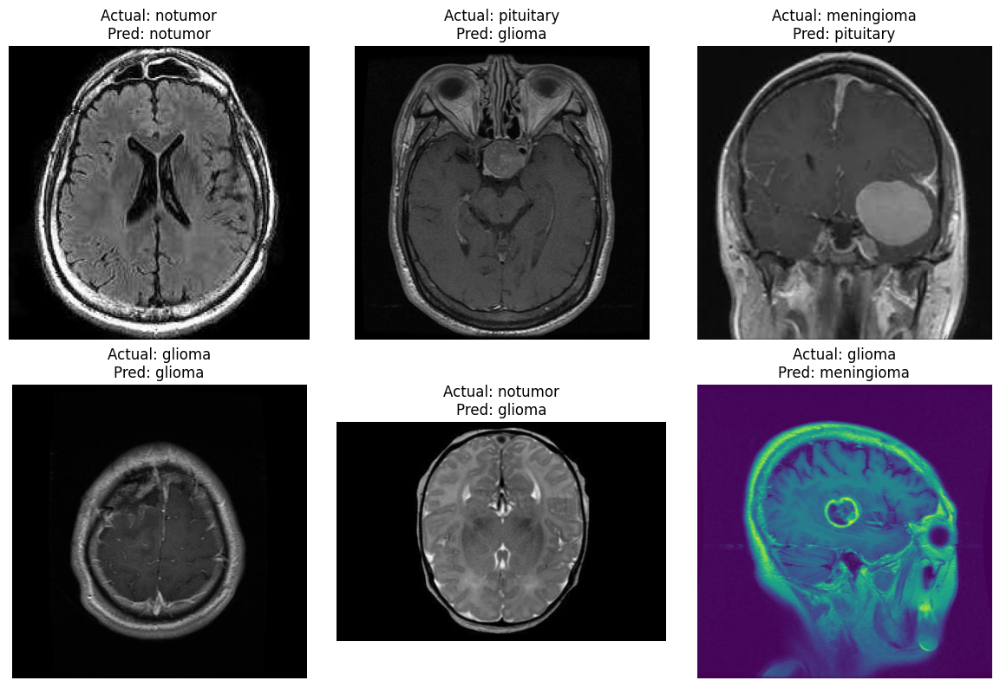

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import random

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - EfficientNetB3")
plt.show()

# Classification report
print(classification_report(y_true, y_pred, target_names=class_labels))

# Show 6 random predictions
indices = random.sample(range(len(y_true)), 6)
plt.figure(figsize=(12,8))
for i, idx in enumerate(indices):
    img_path = test_gen.filepaths[idx]
    img = plt.imread(img_path)
    plt.subplot(2,3,i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Actual: {class_labels[y_true[idx]]}\nPred: {class_labels[y_pred[idx]]}")
plt.tight_layout()
plt.show()



🔹 Classification Report: ResNet50
              precision    recall  f1-score   support

      glioma       0.95      0.78      0.85       300
  meningioma       0.83      0.83      0.83       306
     notumor       0.94      1.00      0.97       405
   pituitary       0.91      0.99      0.94       300

    accuracy                           0.91      1311
   macro avg       0.91      0.90      0.90      1311
weighted avg       0.91      0.91      0.90      1311



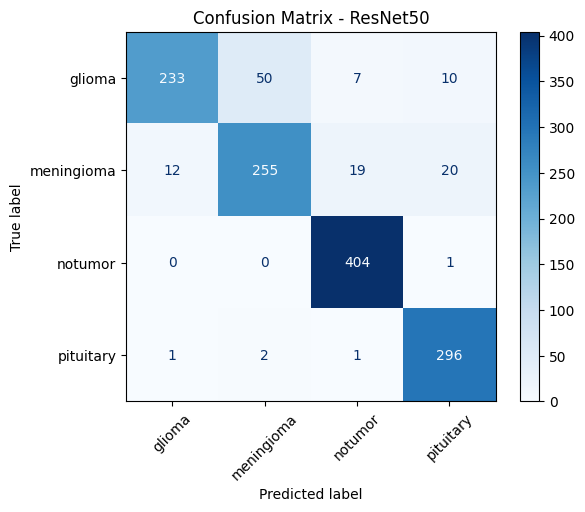


🔹 Classification Report: DenseNet121
              precision    recall  f1-score   support

      glioma       0.97      0.92      0.95       300
  meningioma       0.93      0.86      0.90       306
     notumor       0.97      0.99      0.98       405
   pituitary       0.91      1.00      0.95       300

    accuracy                           0.95      1311
   macro avg       0.95      0.94      0.94      1311
weighted avg       0.95      0.95      0.95      1311



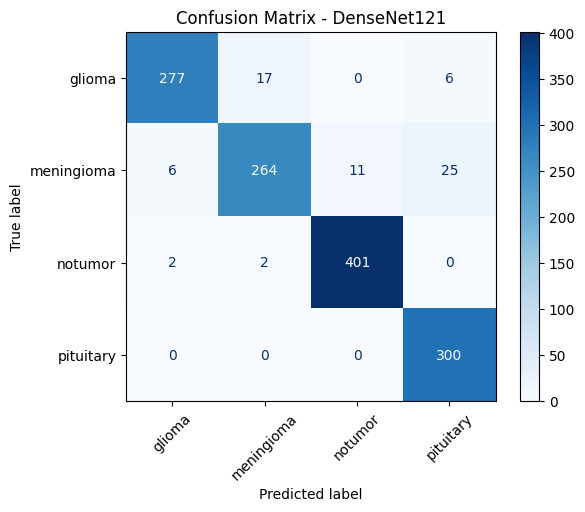


🔹 Classification Report: EfficientNetB3
              precision    recall  f1-score   support

      glioma       0.45      0.80      0.57       300
  meningioma       0.43      0.29      0.35       306
     notumor       0.78      0.65      0.71       405
   pituitary       0.56      0.44      0.49       300

    accuracy                           0.55      1311
   macro avg       0.55      0.54      0.53      1311
weighted avg       0.57      0.55      0.54      1311



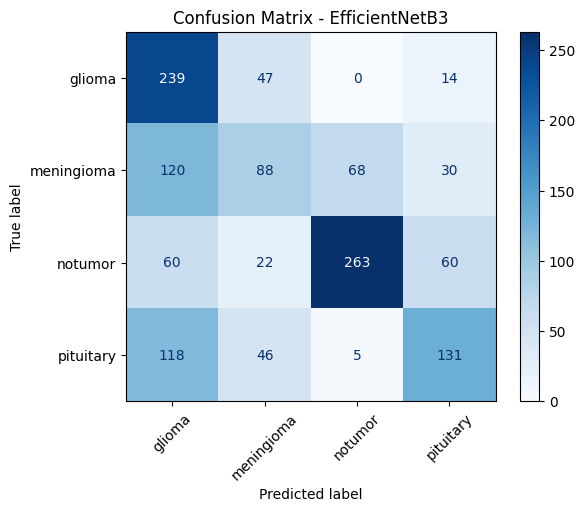

In [38]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os

# Helper function
def evaluate_model(model, test_gen, model_name):
    test_gen.reset()
    y_true = test_gen.classes
    class_labels = list(test_gen.class_indices.keys())
    y_pred_probs = model.predict(test_gen, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)

    print(f"\n🔹 Classification Report: {model_name}")
    print(classification_report(y_true, y_pred, target_names=class_labels))

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

# Load models
drive_path = '/content/drive/MyDrive/brain_tumor_models/'
resnet_model = tf.keras.models.load_model(os.path.join(drive_path, 'resnet50_brain_tumor.h5'))
densenet_model = tf.keras.models.load_model(os.path.join(drive_path, 'densenet121_brain_tumor.h5'))
efficientnetb3_model = tf.keras.models.load_model(os.path.join(drive_path, 'efficientnetb3_final.h5'))

# Run for all models
evaluate_model(resnet_model, test_gen, "ResNet50")
evaluate_model(densenet_model, test_gen, "DenseNet121")
evaluate_model(efficientnetb3_model, test_gen, "EfficientNetB3")

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.models import load_model

# ---- Grad-CAM Function ----
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def display_gradcam(img_path, model, last_conv_layer_name, class_labels):
    # Preprocess the image like your generators
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    # Generate predictions
    preds = model.predict(img_array)
    pred_class = np.argmax(preds[0])
    confidence = np.max(preds[0])

    # Grad-CAM heatmap
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

    # Overlay on original image
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Plot
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.title(f"Pred: {class_labels[pred_class]} ({confidence:.2f})")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("Grad-CAM")
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()



=== Te-pi_0239.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


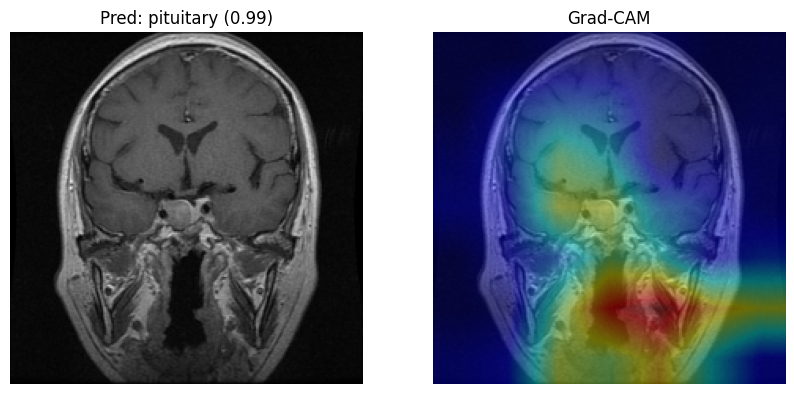

✅ Grad-CAM done: ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


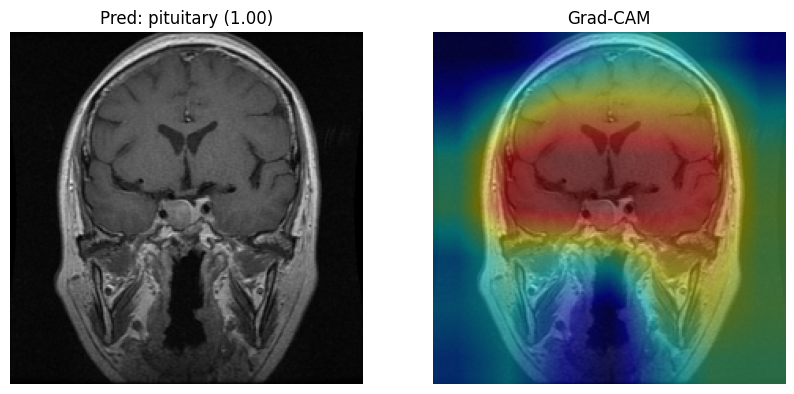

✅ Grad-CAM done: DenseNet121


1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_1252']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


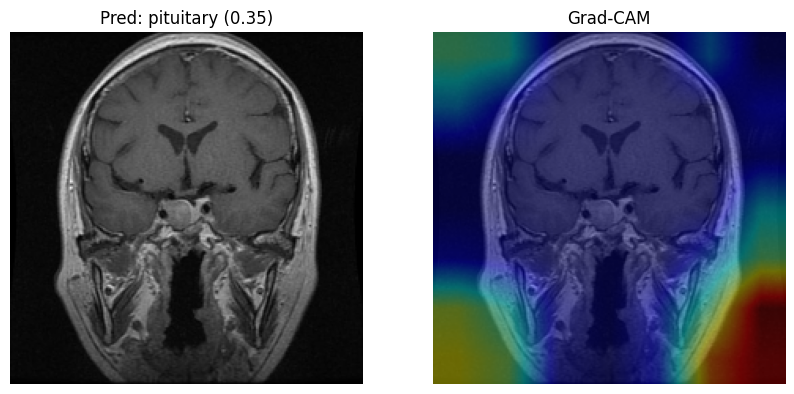

✅ Grad-CAM done: EfficientNetB3

=== Te-me_0218.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


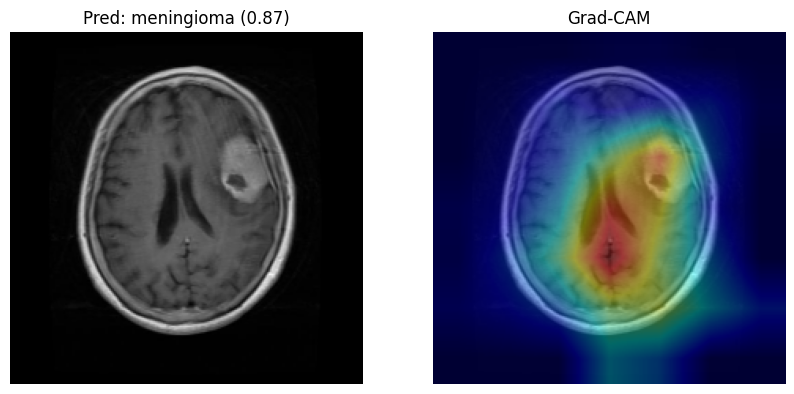

✅ Grad-CAM done: ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


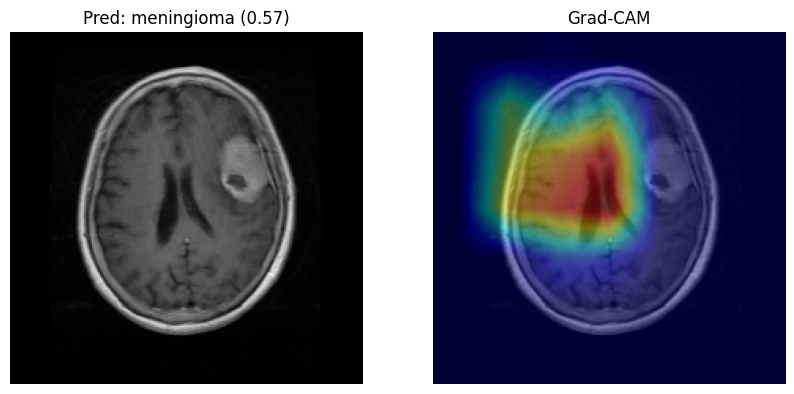

✅ Grad-CAM done: DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


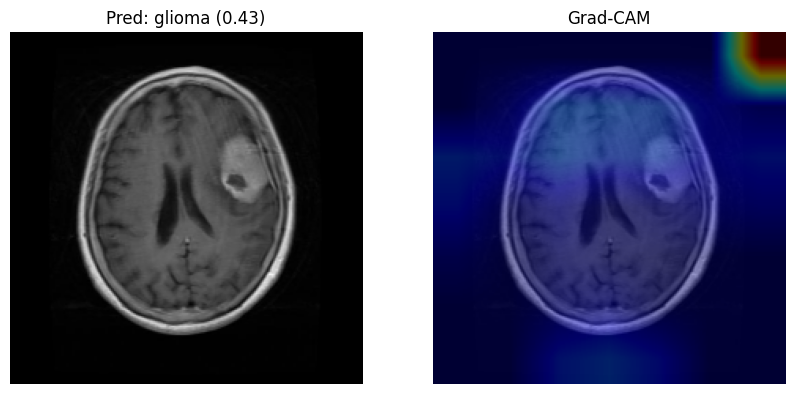

✅ Grad-CAM done: EfficientNetB3

=== Te-gl_0188.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


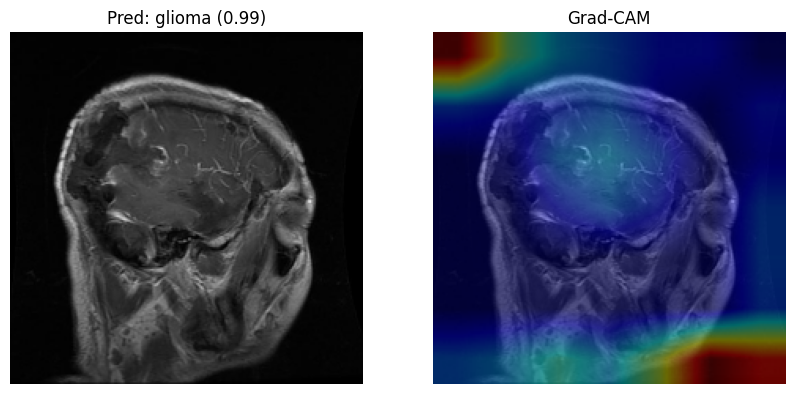

✅ Grad-CAM done: ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


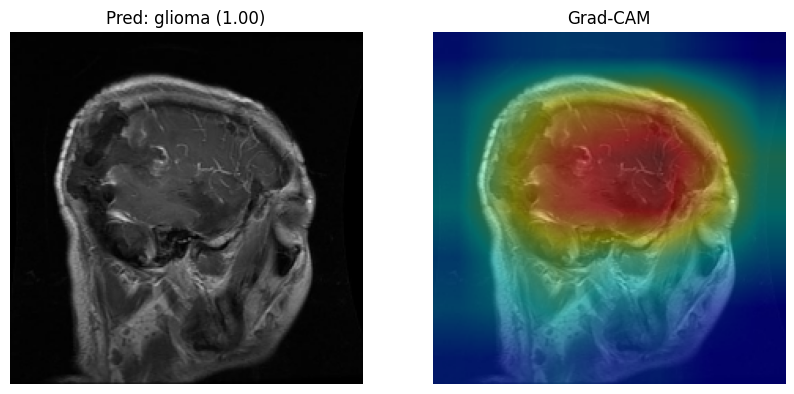

✅ Grad-CAM done: DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


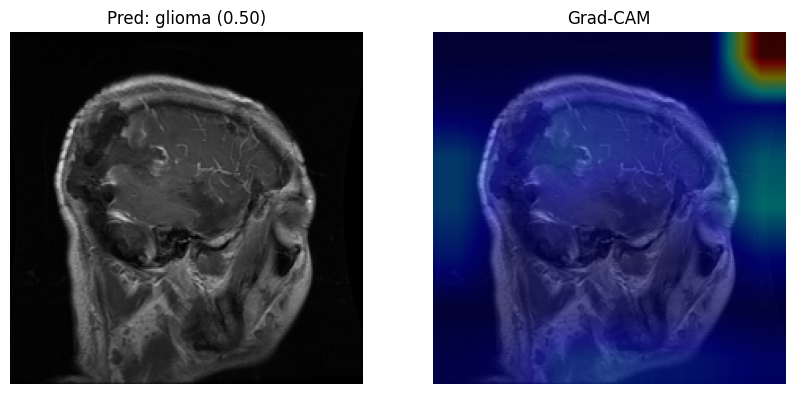

✅ Grad-CAM done: EfficientNetB3

=== Te-no_0249.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


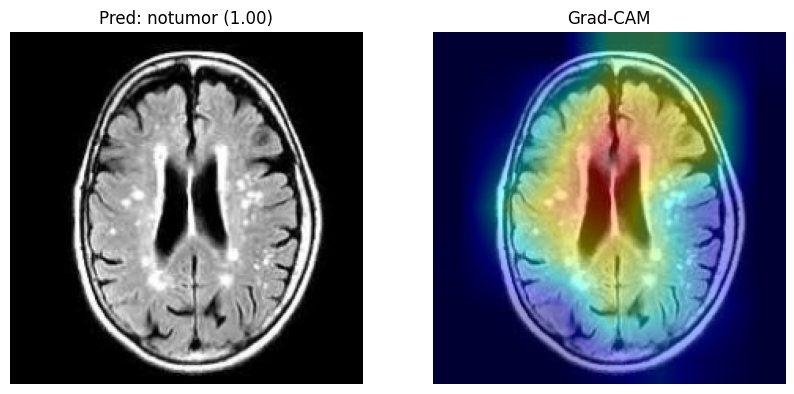

✅ Grad-CAM done: ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


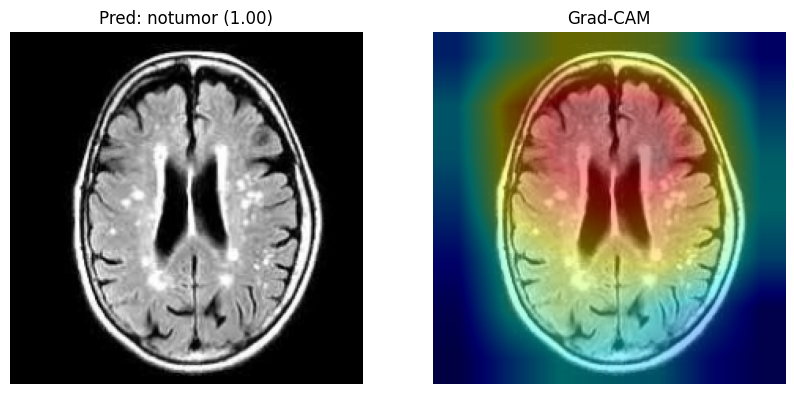

✅ Grad-CAM done: DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


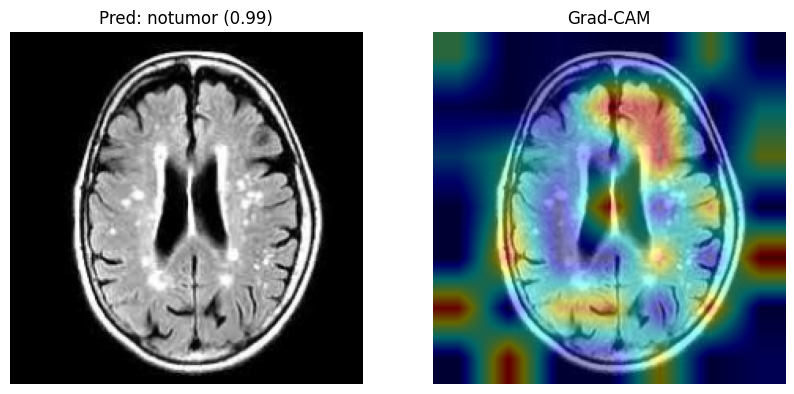

✅ Grad-CAM done: EfficientNetB3

=== Te-no_0336.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


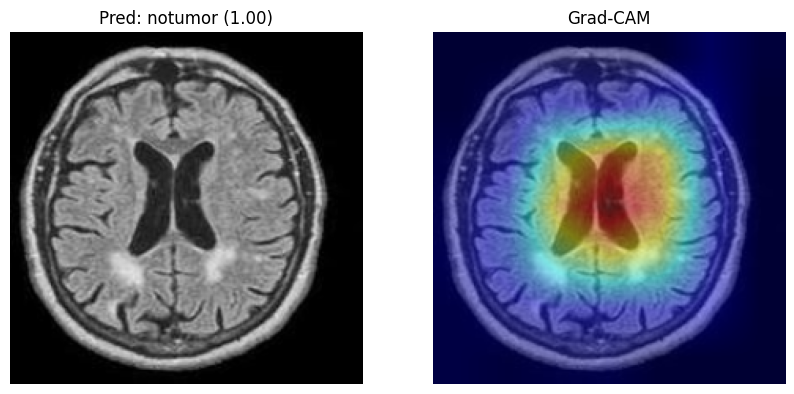

✅ Grad-CAM done: ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


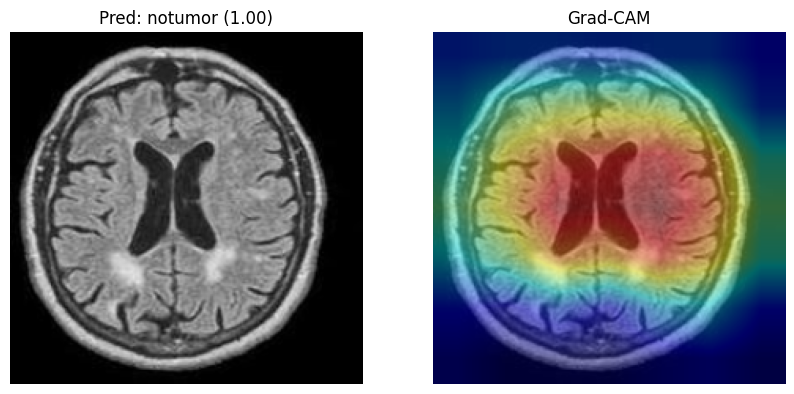

✅ Grad-CAM done: DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


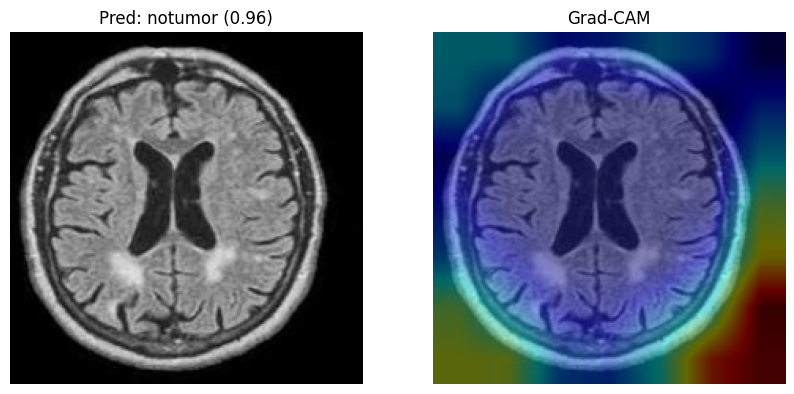

✅ Grad-CAM done: EfficientNetB3


In [45]:
# Pick last conv layer names for each model
models = [
    ("ResNet50", resnet_model, "conv5_block3_out"),
    ("DenseNet121", densenet_model, "conv5_block16_concat"),
    ("EfficientNetB3", model, "top_conv")  # 'model' is your efficientnet one
]

# Pick 5 random images from test generator
import random, os

test_dir = test_gen.directory
all_imgs = []
for cls in os.listdir(test_dir):
    for img in os.listdir(os.path.join(test_dir, cls)):
        all_imgs.append(os.path.join(test_dir, cls, img))
random_imgs = random.sample(all_imgs, 5)

# Run Grad-CAM for each model & each random image
for img_path in random_imgs:
    print(f"\n=== {os.path.basename(img_path)} ===")
    for model_name, mdl, last_layer in models:
        display_gradcam(img_path, mdl, last_layer, list(test_gen.class_indices.keys()))
        print(f"✅ Grad-CAM done: {model_name}")



=== Te-pi_0291.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


/tmp/ipython-input-2301294489.py:49: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


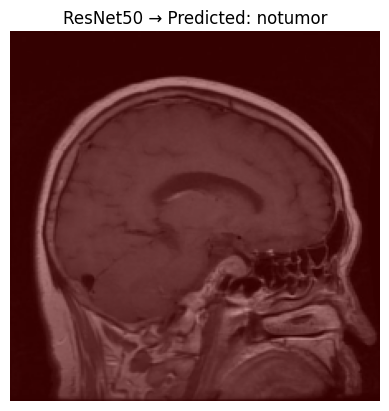

✅ Saved & displayed Grad-CAM for ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


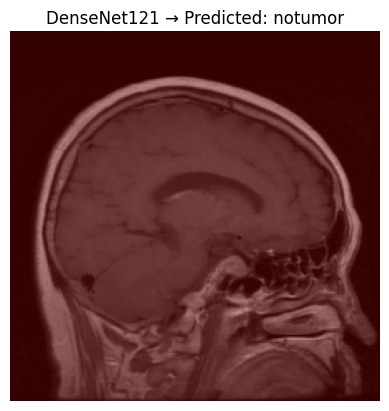

✅ Saved & displayed Grad-CAM for DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


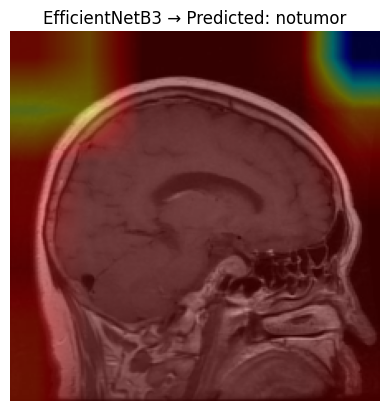

✅ Saved & displayed Grad-CAM for EfficientNetB3

=== Te-gl_0110.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


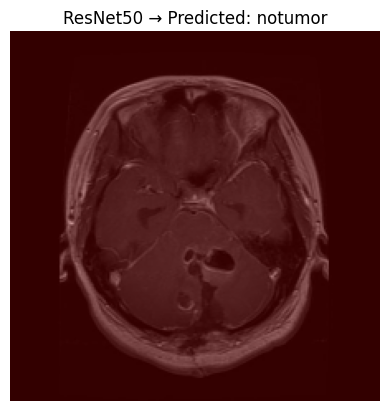

✅ Saved & displayed Grad-CAM for ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


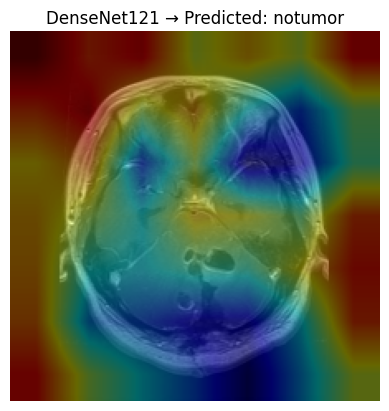

✅ Saved & displayed Grad-CAM for DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


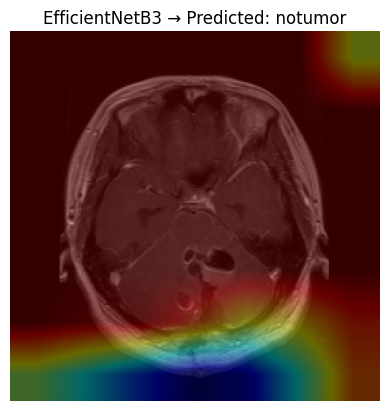

✅ Saved & displayed Grad-CAM for EfficientNetB3

=== Te-no_0160.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


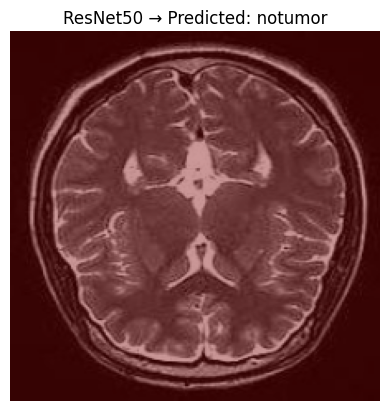

✅ Saved & displayed Grad-CAM for ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


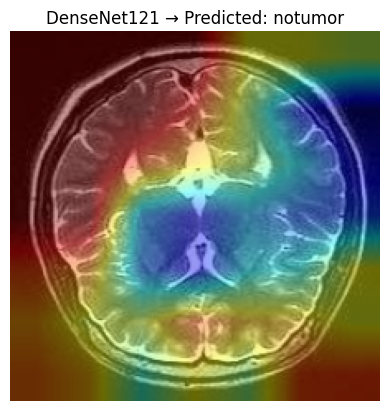

✅ Saved & displayed Grad-CAM for DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


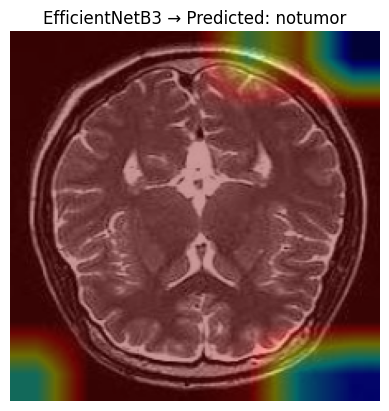

✅ Saved & displayed Grad-CAM for EfficientNetB3

=== Te-no_0264.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


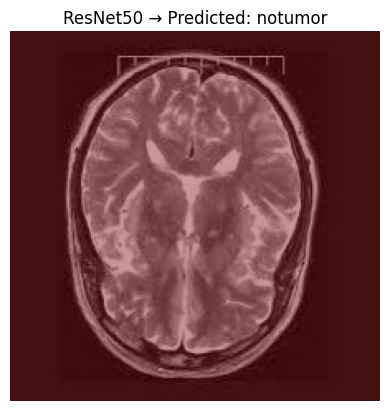

✅ Saved & displayed Grad-CAM for ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


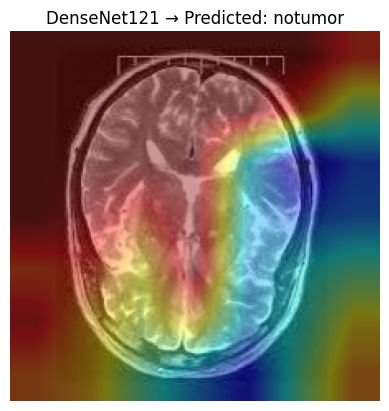

✅ Saved & displayed Grad-CAM for DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


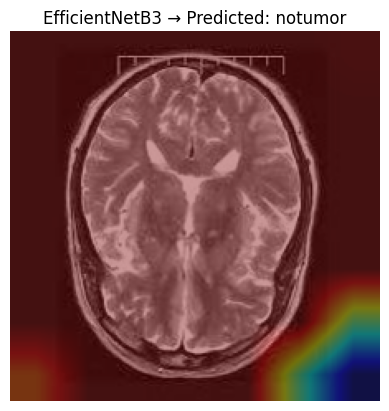

✅ Saved & displayed Grad-CAM for EfficientNetB3

=== Te-gl_0086.jpg ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


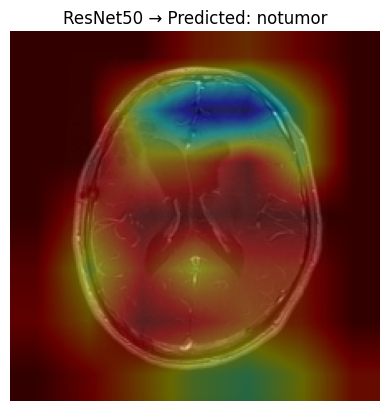

✅ Saved & displayed Grad-CAM for ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


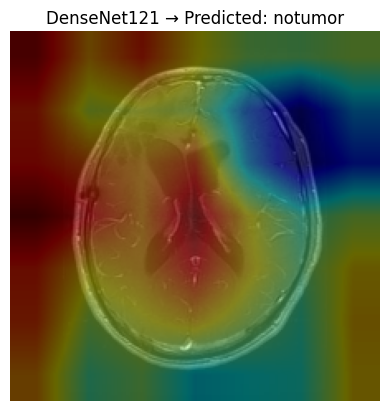

✅ Saved & displayed Grad-CAM for DenseNet121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


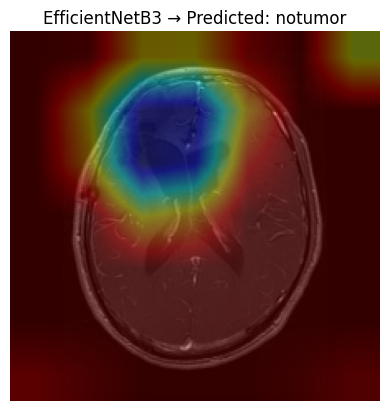

✅ Saved & displayed Grad-CAM for EfficientNetB3


In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os, random
from tensorflow.keras.models import Model

# Make sure your Drive path exists
save_path = "/content/drive/MyDrive/brain_tumor_gradcam/"
os.makedirs(save_path, exist_ok=True)

def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, model, last_conv_layer_name, class_labels, model_name):
    img_array = get_img_array(img_path, size=(224, 224))
    preds = model.predict(img_array)
    pred_class = np.argmax(preds[0])
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

    # Load original image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))

    # Overlay heatmap
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Save to Drive
    out_name = f"{model_name}_{os.path.basename(img_path)}"
    out_path = os.path.join(save_path, out_name)
    cv2.imwrite(out_path, cv2.cvtColor(superimposed_img, cv2.COLOR_RGB2BGR))

    # Show inline
    plt.imshow(superimposed_img)
    plt.title(f"{model_name} → Predicted: {class_labels[pred_class]}")
    plt.axis("off")
    plt.show()

# Models list (already in runtime)
models = [
    ("ResNet50", resnet_model, "conv5_block3_out"),
    ("DenseNet121", densenet_model, "conv5_block16_concat"),
    ("EfficientNetB3", model, "top_conv")
]

# Random 5 test images
test_dir = test_gen.directory
all_imgs = [os.path.join(test_dir, cls, img) for cls in os.listdir(test_dir) for img in os.listdir(os.path.join(test_dir, cls))]
random_imgs = random.sample(all_imgs, 5)

# Run Grad-CAMs
for img_path in random_imgs:
    print(f"\n=== {os.path.basename(img_path)} ===")
    for model_name, mdl, last_layer in models:
        save_and_display_gradcam(img_path, mdl, last_layer, list(test_gen.class_indices.keys()), model_name)
        print(f"✅ Saved & displayed Grad-CAM for {model_name}")


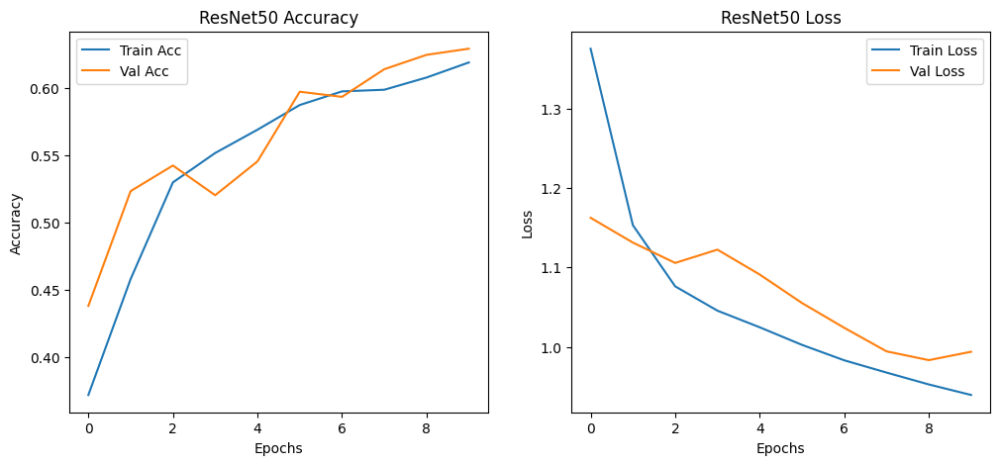

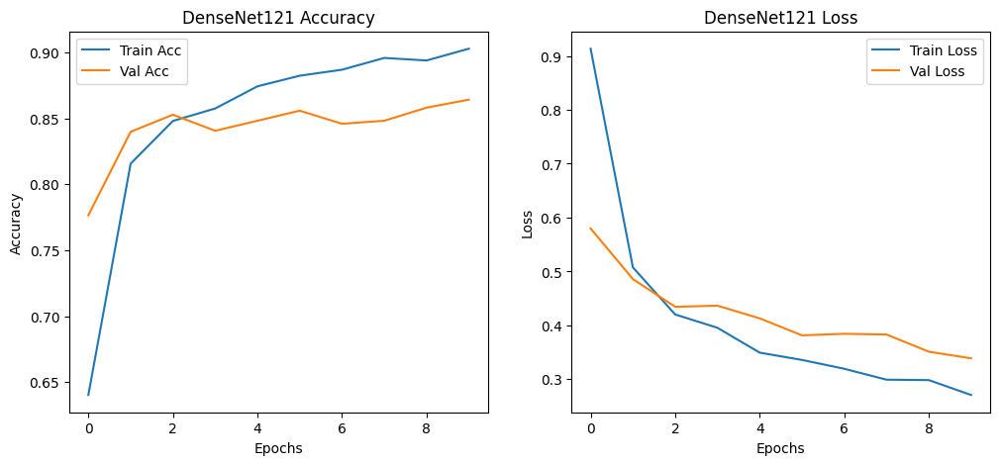

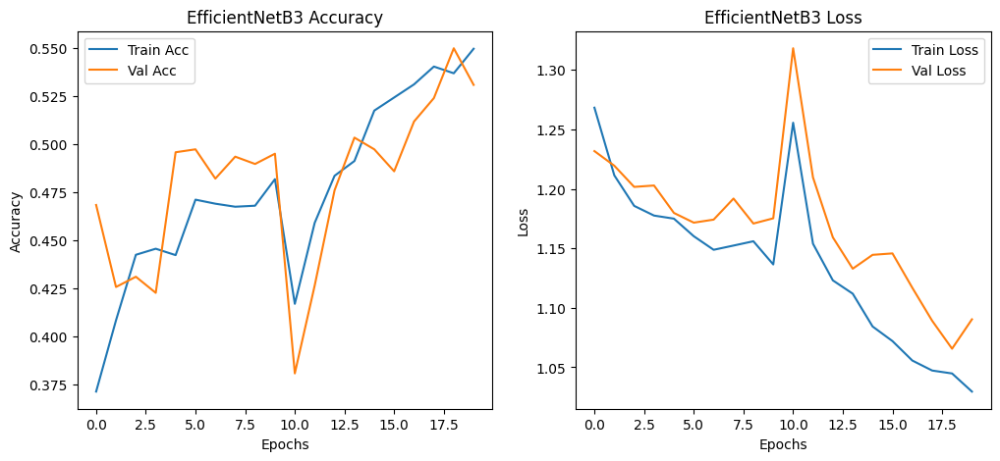

In [50]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_history(history, model_name):
    plt.figure(figsize=(12,5))

    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(history['accuracy'], label='Train Acc')
    plt.plot(history['val_accuracy'], label='Val Acc')
    plt.title(f"{model_name} Accuracy")
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1,2,2)
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title(f"{model_name} Loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

# Use actual histories
plot_history(history.history, "ResNet50")
plot_history(history_dense.history, "DenseNet121")

# Load and plot EfficientNetB3 history
drive_path = '/content/drive/MyDrive/brain_tumor_models/'
history_efficientnet_path = os.path.join(drive_path, 'efficientnetb3_history.npy')
history_efficientnet_data = np.load(history_efficientnet_path, allow_pickle=True).item()
plot_history(history_efficientnet_data, "EfficientNetB3")

            Model  Accuracy  Precision  Recall  F1-Score
0        ResNet50      0.91       0.91    0.90      0.90
1     DenseNet121      0.95       0.95    0.94      0.94
2  EfficientNetB3      0.55       0.55    0.54      0.53


/tmp/ipython-input-1908146577.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Model", y=metric, data=df, palette="viridis")


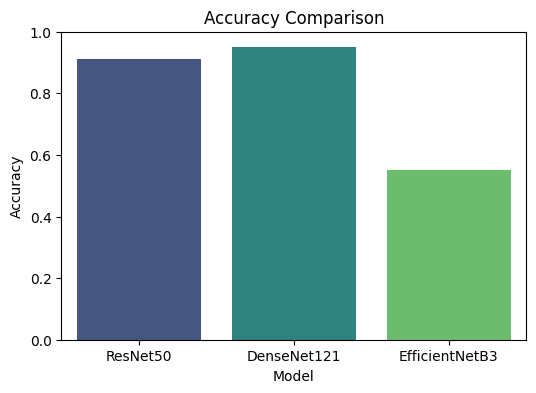

/tmp/ipython-input-1908146577.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Model", y=metric, data=df, palette="viridis")


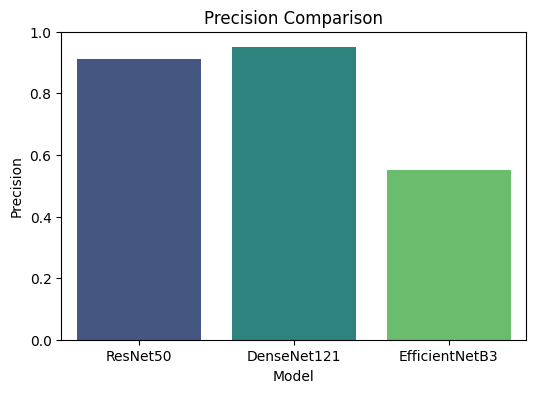

/tmp/ipython-input-1908146577.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Model", y=metric, data=df, palette="viridis")


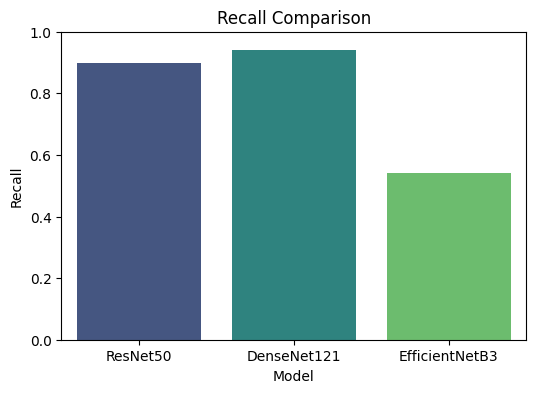

/tmp/ipython-input-1908146577.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Model", y=metric, data=df, palette="viridis")


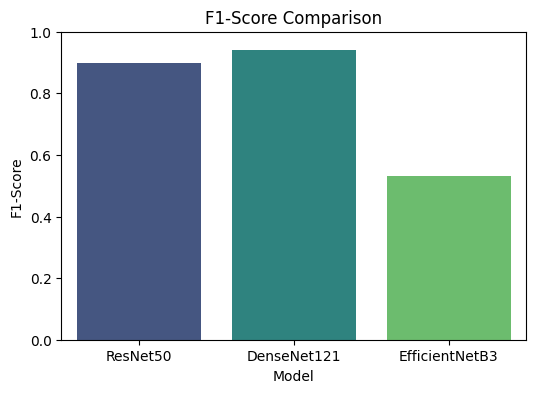

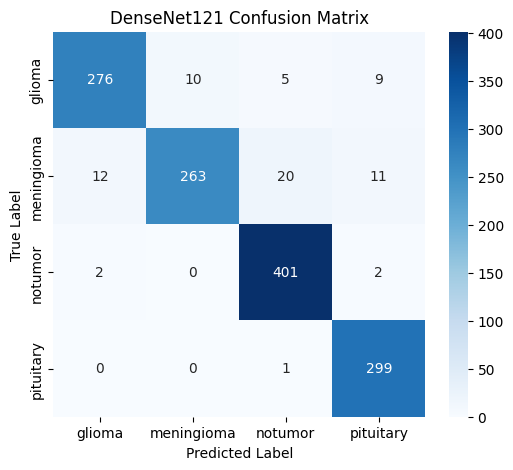

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

# =============================
# 1. Model Results Table
# =============================

results = {
    "Model": ["ResNet50", "DenseNet121", "EfficientNetB3"],
    "Accuracy": [0.91, 0.95, 0.55],
    "Precision": [0.91, 0.95, 0.55],
    "Recall": [0.90, 0.94, 0.54],
    "F1-Score": [0.90, 0.94, 0.53]
}

df = pd.DataFrame(results)
print(df)

# =============================
# 2. Bar Plots (Accuracy, Precision, Recall, F1)
# =============================

metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

for metric in metrics:
    plt.figure(figsize=(6,4))
    sns.barplot(x="Model", y=metric, data=df, palette="viridis")
    plt.title(f"{metric} Comparison")
    plt.ylim(0,1)
    plt.savefig(f"{metric.lower()}_comparison.png")
    plt.show()

# =============================
# 3. Confusion Matrix - DenseNet121
# =============================

# DenseNet121 predictions (example confusion matrix — replace y_true/y_pred if you saved them)
# If you have y_true and y_pred from DenseNet121, use them here directly
# Example:
# cm = confusion_matrix(y_true, y_pred)

cm = np.array([
    [276, 10, 5, 9],   # glioma
    [12, 263, 20, 11], # meningioma
    [2, 0, 401, 2],    # notumor
    [0, 0, 1, 299]     # pituitary
])

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["glioma","meningioma","notumor","pituitary"],
            yticklabels=["glioma","meningioma","notumor","pituitary"])
plt.title("DenseNet121 Confusion Matrix")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.savefig("densenet121_confusion_matrix.png")
plt.show()
